In [4]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('/home/beans/bespoke')

from constants import *
from traj_utils import *
import matplotlib.pyplot as plt
from viz_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
%%time
aux, targets, run_paths = [], [], []
n_couldnt_load_runs = 0

#for d in range(N_RUNNERS):
for d in range(1):
    datagen_id = ("00"+str(d))[-2:]
    for r in range(RUNS_TO_STORE_PER_PROCESS):
        run_path = f"/home/beans/blender_membank/dataloader_{datagen_id}/run_{r}"
        n_targets_paths_files = len(glob.glob(f"{run_path}/targets/*.npy"))
        targets_paths = [f'{run_path}/targets/{i}.npy' for i in range(1,EPISODE_LEN+1)]
        
        if n_targets_paths_files < len(targets_paths):
            print(run_path)
            n_couldnt_load_runs += 1
            continue
            
        _aux = np.concatenate([np.load(f'{run_path}/aux/{i}.npy') for i in range(1,EPISODE_LEN+1)], axis=0)
        _targets = np.concatenate([np.load(p) for p in targets_paths], axis=0)
        
        aux.append(_aux)
        targets.append(_targets)
        run_paths.append(run_path)
        
aux = na(np.stack(aux, axis=0), AUX_PROPS)
targets = np.stack(targets, axis=0)

print(f"couldn't load {n_couldnt_load_runs} out of {N_RUNNERS*RUNS_TO_STORE_PER_PROCESS} runs")

couldn't load 0 out of 1152 runs
CPU times: user 38 s, sys: 3.56 s, total: 41.6 s
Wall time: 44 s


In [6]:
all_wp_angles, all_wp_dists, all_wp_rolls, all_wp_zs = np.split(targets, 4, axis=-1)

In [7]:
%%time
speed_mask = get_speed_mask(aux[:,:,'speed'])
all_headings = get_headings_from_traj_batch(all_wp_angles, all_wp_dists)
all_curvatures = get_curvatures_from_headings_batch(all_headings)

CPU times: user 3 s, sys: 2.46 ms, total: 3 s
Wall time: 3.02 s


In [8]:
aux.shape

(96, 1280, 39)

In [9]:
all_wp_angles.shape, all_wp_dists.shape, all_headings.shape, all_curvatures.shape, speed_mask.shape

((96, 1280, 30),
 (96, 1280, 30),
 (96, 1280, 30),
 (96, 1280, 30),
 (96, 1280, 30))

In [10]:
mm = 0
for i in range(len(all_curvatures)):
    m = abs(all_curvatures[i]).max()
    if m > .2:
        print(i, m)
        mm += 1

3 0.2515738
44 0.20706993
56 0.20301712
67 0.20715773


In [41]:
ix = 0
run_paths[ix]

'/home/beans/blender_membank/dataloader_00/run_0'

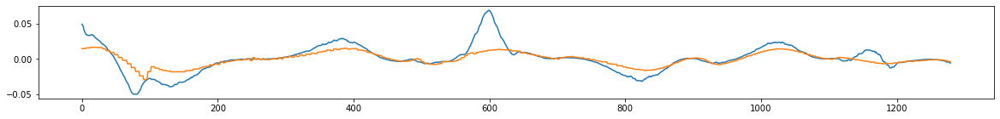

In [42]:
plt.figure(figsize=(20,2))
plt.plot(all_wp_angles[ix,:,0])
plt.plot(aux[ix,:,'curvature_at_ego'])

In [43]:
aux[ix,:,'curvature_at_ego'].max(), aux[ix,:,'curvature_at_ego'].min()

(NamedArray(0.01655477, dtype=float32), NamedArray(-0.02900068, dtype=float32))

In [44]:
# view single run

y = aux[ix, :, "tire_angle"]
fig = px.scatter(x=list(range(len(y))), y=y, width=1000, height=400)
#fig.update_xaxes(range=[0, 50])
#fig.update_yaxes(range=[0, 12])
fig.show()

In [47]:
# avg te
te = abs((aux[:, 1:, "tire_angle"] - aux[:, :-1, "tire_angle"]))
te.mean()

NamedArray(0.00076328, dtype=float32)

In [57]:
# avg te on tight curves
te[aux[:, 1:, "tire_angle"]>.2].mean()

NamedArray(0.00813437, dtype=float32)

119728.0

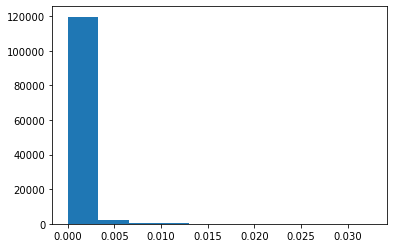

In [54]:
plt.hist(te.flatten())[0][0]

In [48]:
import plotly.graph_objects as go
import plotly.express as px

In [52]:
fig = px.scatter(x=abs(aux[:,1:,"tire_angle"].flatten()), y=te.flatten(), width=600, height=600)
fig.show()

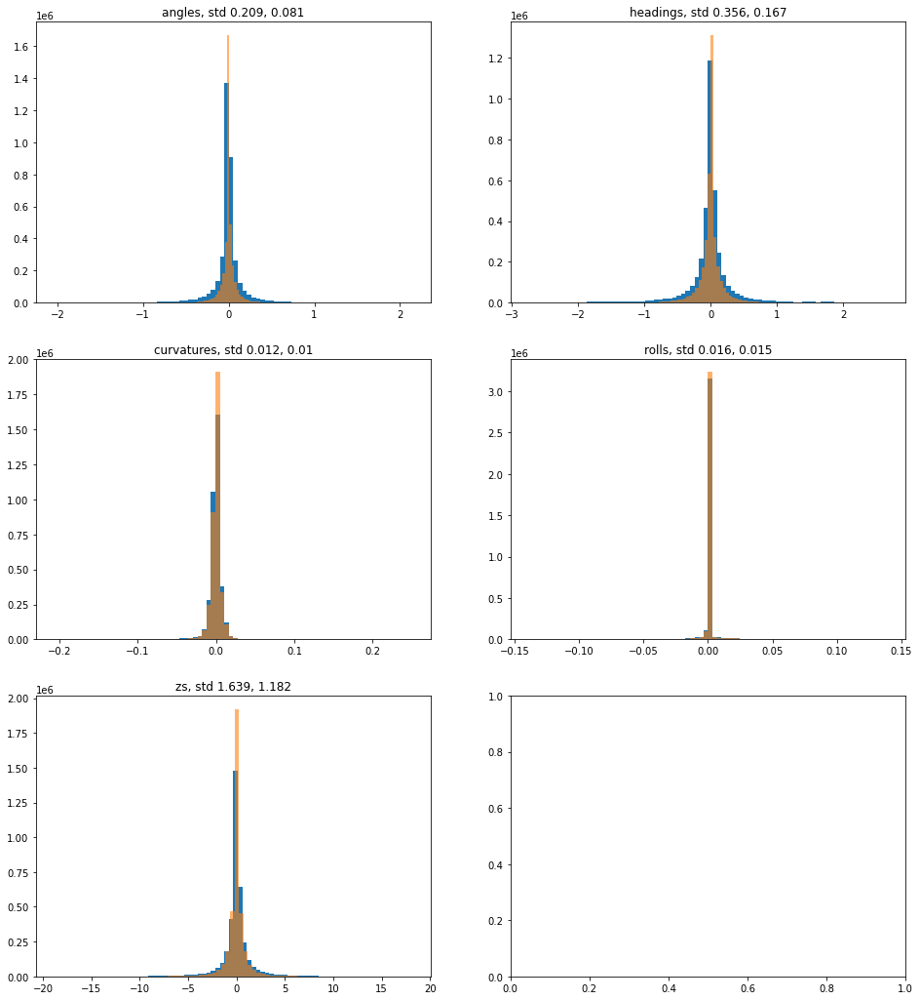

In [14]:
ws = [all_wp_angles, all_headings, all_curvatures, all_wp_rolls, all_wp_zs]
plot_wps(ws, speed_mask)

In [15]:
mean_headings = abs(all_headings).mean(axis=0).mean(0)
mean_headings

array([0.03798741, 0.04417093, 0.05022104, 0.05626298, 0.06229312,
       0.06830667, 0.07430348, 0.08027871, 0.08622645, 0.0921437 ,
       0.09802847, 0.10387965, 0.10969174, 0.11546195, 0.12118647,
       0.1268617 , 0.13248697, 0.13806124, 0.14357933, 0.14886925,
       0.1991102 , 0.2457488 , 0.28776437, 0.32518956, 0.35851386,
       0.38815314, 0.41417828, 0.43700886, 0.4570405 , 0.46761507],
      dtype=float32)

In [16]:
mean_headings[-1] / mean_headings[0]

12.309736

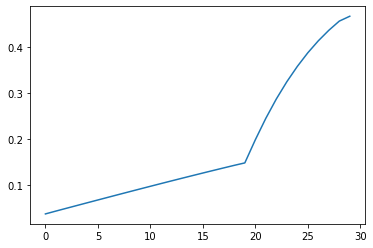

In [17]:
plt.plot(mean_headings)

In [18]:
mean_angles = abs(all_wp_angles).mean(axis=0).mean(0)
mean_angles

array([0.01091976, 0.01491643, 0.0188988 , 0.02269153, 0.02633364,
       0.0298601 , 0.03329649, 0.03666063, 0.03996542, 0.04322142,
       0.04643468, 0.04961114, 0.05275462, 0.05586826, 0.05895313,
       0.06201137, 0.06504403, 0.06805223, 0.07103635, 0.07399731,
       0.10241685, 0.12878886, 0.15326509, 0.17591566, 0.19678524,
       0.21596661, 0.2336061 , 0.24981181, 0.26468927, 0.278363  ],
      dtype=float32)

In [19]:
mean_angles[-1] / mean_angles[0]

25.491674

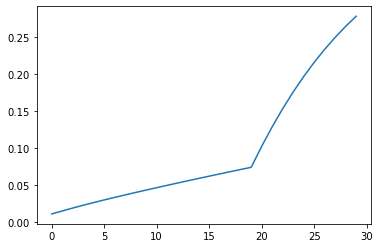

In [20]:
plt.plot(mean_angles)

In [21]:
all_wp_angles[:,:,0].std()

0.031219529

In [22]:
AUX_TARGET_PROPS

['has_stop',
 'stop_dist',
 'has_lead',
 'lead_dist',
 'lead_speed',
 'dagger_shift',
 'lane_width',
 'rd_is_lined',
 'left_turn',
 'right_turn']

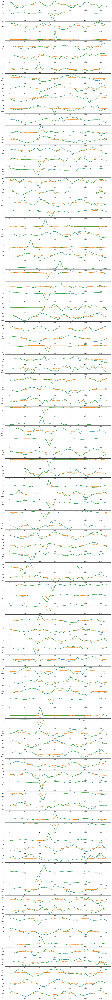

In [23]:
n_cols = 1
n_rows = math.ceil(len(aux)/n_cols)
fig, subplots = plt.subplots(n_rows,n_cols, figsize=(20,n_rows*2)) # figsize is w,h
subplots = subplots.flatten()

for i in range(len(aux)):
    ax = subplots[i]
    ax.plot(aux[i, :, 'tire_angle'])
    ax.plot(aux[i, :, 'curvature_at_ego'])    
    ax.plot(aux[i, :, 'tire_angle_lagged'])
    

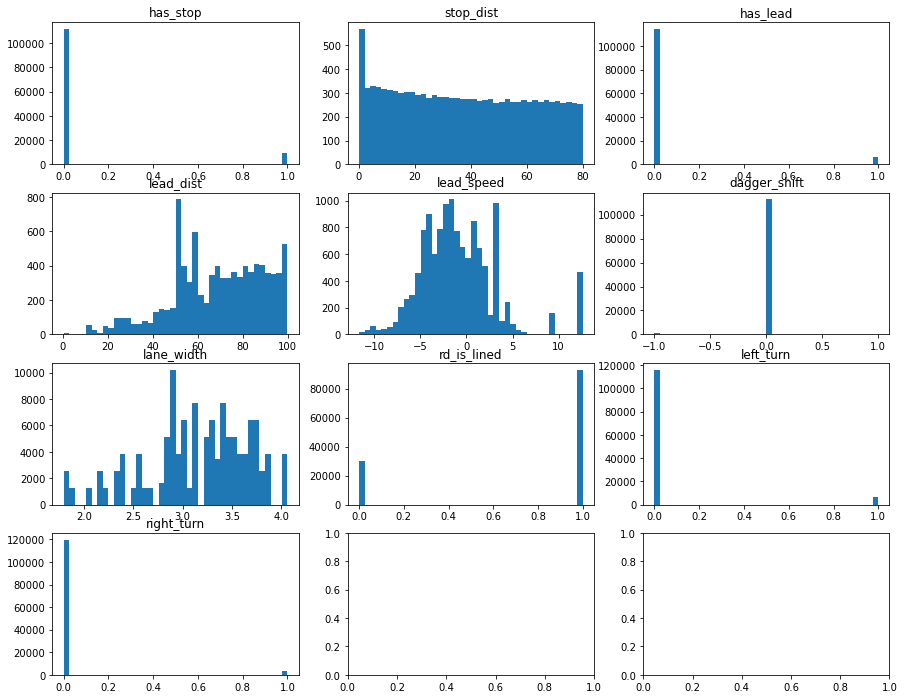

In [24]:
plot_aux(aux, AUX_TARGET_PROPS)

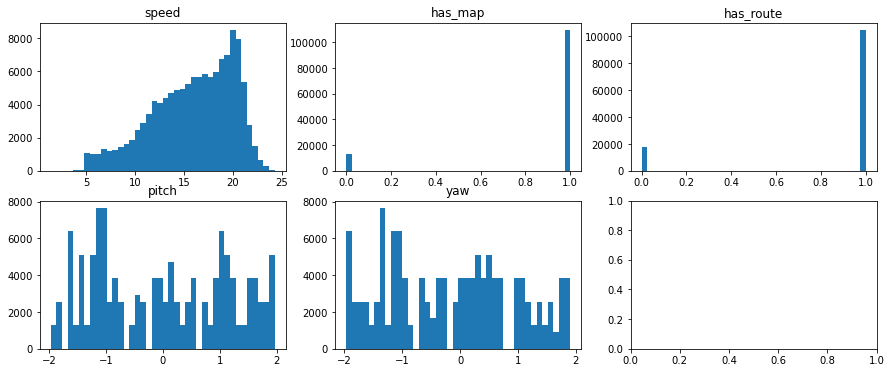

In [25]:
plot_aux(aux, AUX_MODEL_PROPS)

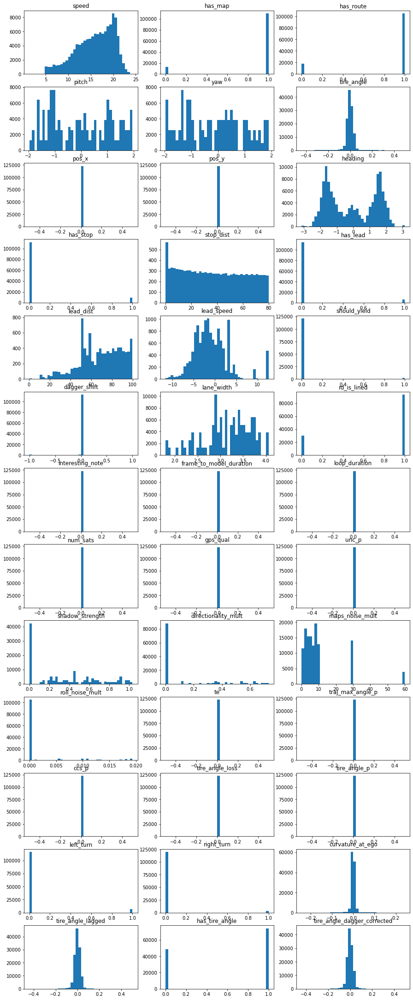

In [26]:
plot_aux(aux, AUX_PROPS)

In [27]:
np.quantile(abs(aux[:,:,"tire_angle"]), .99) #TODO this was .137, check again

0.14459430873394008

In [28]:
abs(aux[:,:,"tire_angle"]).max()

NamedArray(0.49758205, dtype=float32)

In [29]:
aux[:,:,"dagger_shift"].min()

NamedArray(-1., dtype=float32)

(array([721., 224., 101.,  67.,  36.,  60.,  27.,  18.,   9.,  17.]),
 NamedArray([0.01139715, 0.03451829, 0.05763943, 0.08076058, 0.10388172,
             0.12700285, 0.150124  , 0.17324513, 0.19636628, 0.21948741,
             0.24260856], dtype=float32),
 <BarContainer object of 10 artists>)

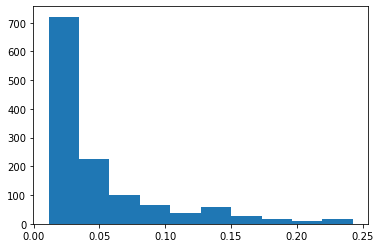

In [30]:
plt.hist(aux[:,:,"curvature_at_ego"].max(0))

In [31]:
m = aux[:,:,"curvature_at_ego"].max(0)
len(m[m<.3]) / len(m)

1.0